In [9]:
#!pip install -U -q segmentation-models
#!pip install -q tensorflow
#!pip install -q keras
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
import segmentation_models as sm

Segmentation Models: using `tf.keras` framework.


In [10]:
import os
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use("ggplot")
%matplotlib inline

from tqdm.notebook import tqdm_notebook, tnrange
from tqdm import tqdm
from itertools import chain
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label
from sklearn.model_selection import train_test_split

import tensorflow as tf

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from keras.layers.core import Lambda, RepeatVector, Reshape
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D, GlobalMaxPool2D
from tensorflow.keras.layers import concatenate,add
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import img_to_array,load_img,array_to_img
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
from sklearn.utils import class_weight

import glob
import shutil
from keras.metrics import MeanIoU
from keras import backend as K

In [4]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
!unzip "/content/drive/My Drive/Dataset_Capstone/test.zip"

Archive:  /content/drive/My Drive/Dataset_Capstone/test.zip
   creating: test/
   creating: test/SS_EA001/
  inflating: __MACOSX/test/._SS_EA001  
  inflating: test/.DS_Store          
  inflating: __MACOSX/test/._.DS_Store  
   creating: test/SS_EA041/
  inflating: __MACOSX/test/._SS_EA041  
   creating: test/SS_EA025/
  inflating: __MACOSX/test/._SS_EA025  
   creating: test/SS_EA034/
   creating: test/SS_EA002/
  inflating: __MACOSX/test/._SS_EA002  
  inflating: test/SS_EA001/EA_001_VarFat_293_mask.png  
  inflating: __MACOSX/test/SS_EA001/._EA_001_VarFat_293_mask.png  
  inflating: test/SS_EA001/EA_001_VarFat_285_mask.png  
  inflating: __MACOSX/test/SS_EA001/._EA_001_VarFat_285_mask.png  
  inflating: test/SS_EA001/EA_001_VarFat_285_img.png  
  inflating: __MACOSX/test/SS_EA001/._EA_001_VarFat_285_img.png  
  inflating: test/SS_EA001/EA_001_VarFat_290_img.png  
  inflating: __MACOSX/test/SS_EA001/._EA_001_VarFat_290_img.png  
  inflating: test/SS_EA001/EA_001_VarFat_280_img.png  

In [7]:
!unzip "/content/drive/My Drive/Dataset_Capstone/train_local.zip"

Archive:  /content/drive/My Drive/Dataset_Capstone/train_local.zip
   creating: train_local/
   creating: train_local/SS_EA031/
  inflating: train_local/.DS_Store   
  inflating: __MACOSX/train_local/._.DS_Store  
   creating: train_local/SS_045/
   creating: train_local/EA036_SS/
   creating: train_local/SS/
   creating: train_local/SS_EA_050/
   creating: train_local/SS_3/
   creating: train_local/SS_EA026/
  inflating: train_local/SS_EA031/EA031_860_img.png  
  inflating: train_local/SS_EA031/EA031_908_img.png  
  inflating: train_local/SS_EA031/EA031_815_mask.png  
  inflating: train_local/SS_EA031/EA031_779_mask.png  
  inflating: train_local/SS_EA031/EA031_767_img.png  
  inflating: train_local/SS_EA031/EA031_812_img.png  
  inflating: train_local/SS_EA031/EA031_887_mask.png  
  inflating: train_local/SS_EA031/EA031_863_mask.png  
  inflating: train_local/SS_EA031/EA031_884_img.png  
  inflating: train_local/SS_EA031/EA031_923_mask.png  
  inflating: train_local/SS_EA031/EA031_91

In [3]:
def count_img(root, total, folders, total_count, text):
    for filename in tqdm(os.listdir(root)):
        if filename != ".DS_Store":
            folders.append(filename)
            ids = next(os.walk(root+'/'+filename))[2]# list of names all images in the given path
            total_count.append(len(ids))
            total +=len(ids)
    print(text)
    print("Number of images and masks = ", total)
    print("The folders containing images and masks are :", folders)
    print("Image tally accordingly :", total_count)
    return total, folders, total_count

In [4]:
def mac_equalizer(total_count):
    for i in range(len(total_count)):
        if total_count[i] % 2 != 0 :
            total_count[i] -= 1
    print("New count is :", total_count)
    print("New total = ", sum(total_count))
    return total_count,sum(total_count)

In [5]:
def label_maker(masks):
  labelencoder = LabelEncoder()
  n, h, w, _ = masks.shape
  masks_reshaped = masks.reshape(-1,1)
  masks_reshaped_encoded = labelencoder.fit_transform(masks_reshaped)
  masks_encoded_original_shape = masks_reshaped_encoded.reshape(n, h, w)
  masks_input = np.expand_dims(masks_encoded_original_shape, axis=3)
  print(np.unique(masks_encoded_original_shape), masks_input.shape)
  return masks_input, masks_reshaped_encoded

In [6]:
def upload(root, folders, X, y, text):
    count_img = 0
    count_mask = 0
    
    print(text)
    
    for file in folders : 
        image_dir_path = root+ "/" +file
        mask_dir_path =  root+ "/" +file
        
        for img_path in tqdm(sorted(glob.glob(os.path.join(image_dir_path, "*_img.png")))):
            img = load_img(img_path, color_mode = "grayscale")
            img = img_to_array(img)
            img = resize(img, (512, 512, 1), mode = 'constant', preserve_range = True)
            img = img/255.0
            X[count_img]=img 
            count_img+=1
        print("Image upload count = ", count_img)
        
        
        for mask_path in tqdm(sorted(glob.glob(os.path.join(mask_dir_path, "*_mask.png")))):
            mask = load_img(mask_path, color_mode = "grayscale")
            mask = img_to_array(mask)
            mask = resize(mask, (512, 512, 1), mode = 'constant', preserve_range = True)
            mask = mask/255.0
            y[count_mask]=mask
            count_mask+=1
        print("Mask upload count = ", count_mask)
    return X,y

In [7]:
def pre_visualize(X, y, text, ix = None) :
    
    print(text)
    for i in range(5) : 
        if ix == None :
            ix = random.randint(0, len(X)-1)
        
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (20, 15))
        ax1.imshow(X[ix], cmap = 'gray', interpolation = 'bilinear')
        ax1.set_title('Image')
        
        ax2.imshow(y[ix], cmap = 'gray', interpolation = 'bilinear')
        ax2.set_title('Mask')
        ix = None

In [11]:
train_text = "\t\t\t\t\t\tTraining "
valid_text = "\t\t\t\t\t\tValidation "
test_text = "\t\t\t\t\t\t\tTesting "
train_total = 0
test_total = 0
train_total_count = []
test_total_count = []
train_folders = []
test_folders = []
train_root = "train_local"
test_root = "test"

train_total, train_folders, train_total_count = count_img(train_root, train_total, train_folders, train_total_count, "Training")
test_total, test_folders, test_total_count = count_img(test_root, test_total, test_folders, test_total_count, "Testing")


100%|██████████| 8/8 [00:00<00:00, 5623.33it/s]


Training
Number of images and masks =  457
The folders containing images and masks are : ['SS_EA026', 'SS_3', 'SS_EA031', 'SS_045', 'EA036_SS', 'SS', 'SS_EA_050']
Image tally accordingly : [43, 42, 157, 56, 45, 63, 51]


100%|██████████| 6/6 [00:00<00:00, 18382.63it/s]

Testing
Number of images and masks =  54
The folders containing images and masks are : ['SS_EA002', 'SS_EA034', 'SS_EA001', 'SS_EA041', 'SS_EA025']
Image tally accordingly : [11, 13, 10, 10, 10]


In [13]:
train_total_count, train_total = mac_equalizer(train_total_count)
test_total_count, test_total = mac_equalizer(test_total_count)

New count is : [42, 42, 156, 56, 44, 62, 50]
New total =  452
New count is : [10, 12, 10, 10, 10]
New total =  52


In [14]:
im_width = 512
im_height = 512
n_classes = 5 

X = np.zeros((int(train_total/2), im_height, im_width, 1), dtype=np.float32)
y = np.zeros((int(train_total/2), im_height, im_width, 1), dtype=np.float32)

X_test = np.zeros((int(test_total/2), im_height, im_width, 1), dtype=np.float32)
y_test = np.zeros((int(test_total/2), im_height, im_width, 1), dtype=np.float32)

In [15]:
X, y = upload(train_root, train_folders, X, y, train_text)

						Training 


100%|██████████| 21/21 [00:00<00:00, 37.91it/s]


Image upload count =  21


100%|██████████| 21/21 [00:00<00:00, 25.57it/s]


Mask upload count =  21


100%|██████████| 21/21 [00:00<00:00, 23.14it/s]


Image upload count =  42


100%|██████████| 21/21 [00:00<00:00, 25.42it/s]


Mask upload count =  42


100%|██████████| 78/78 [00:02<00:00, 31.06it/s]


Image upload count =  120


100%|██████████| 78/78 [00:01<00:00, 42.90it/s]


Mask upload count =  120


100%|██████████| 28/28 [00:00<00:00, 37.22it/s]


Image upload count =  148


100%|██████████| 28/28 [00:00<00:00, 40.79it/s]


Mask upload count =  148


100%|██████████| 22/22 [00:00<00:00, 37.48it/s]


Image upload count =  170


100%|██████████| 22/22 [00:00<00:00, 42.97it/s]


Mask upload count =  170


100%|██████████| 31/31 [00:00<00:00, 39.14it/s]


Image upload count =  201


100%|██████████| 31/31 [00:00<00:00, 43.67it/s]


Mask upload count =  201


100%|██████████| 25/25 [00:00<00:00, 40.26it/s]


Image upload count =  226


100%|██████████| 25/25 [00:00<00:00, 43.98it/s]

Mask upload count =  226


In [16]:
X_test, y_test = upload(test_root, test_folders, X_test, y_test, test_text)

							Testing 


100%|██████████| 5/5 [00:00<00:00, 37.29it/s]


Image upload count =  5


100%|██████████| 5/5 [00:00<00:00, 38.13it/s]


Mask upload count =  5


100%|██████████| 6/6 [00:00<00:00, 37.28it/s]


Image upload count =  11


100%|██████████| 6/6 [00:00<00:00, 44.07it/s]


Mask upload count =  11


100%|██████████| 5/5 [00:00<00:00, 36.74it/s]


Image upload count =  16


100%|██████████| 5/5 [00:00<00:00, 39.16it/s]


Mask upload count =  16


100%|██████████| 5/5 [00:00<00:00, 40.22it/s]


Image upload count =  21


100%|██████████| 5/5 [00:00<00:00, 44.41it/s]


Mask upload count =  21


100%|██████████| 5/5 [00:00<00:00, 37.91it/s]


Image upload count =  26


100%|██████████| 5/5 [00:00<00:00, 44.16it/s]

Mask upload count =  26


In [17]:
np.unique(y)

array([0.        , 0.24705882, 0.49803922, 0.7490196 , 1.        ],
      dtype=float32)

In [18]:
y.shape

(226, 512, 512, 1)

In [19]:
y, y_encoded = label_maker(y)
y_test, y_test_encoded = label_maker(y_test)

/usr/local/lib/python3.9/dist-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[0 1 2 3 4] (226, 512, 512, 1)


/usr/local/lib/python3.9/dist-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[0 1 2 3 4] (26, 512, 512, 1)


In [20]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, train_size = 0.8, random_state = 0)

In [21]:
len(X_train)

180

In [22]:
len(X_valid)

46

						Training 


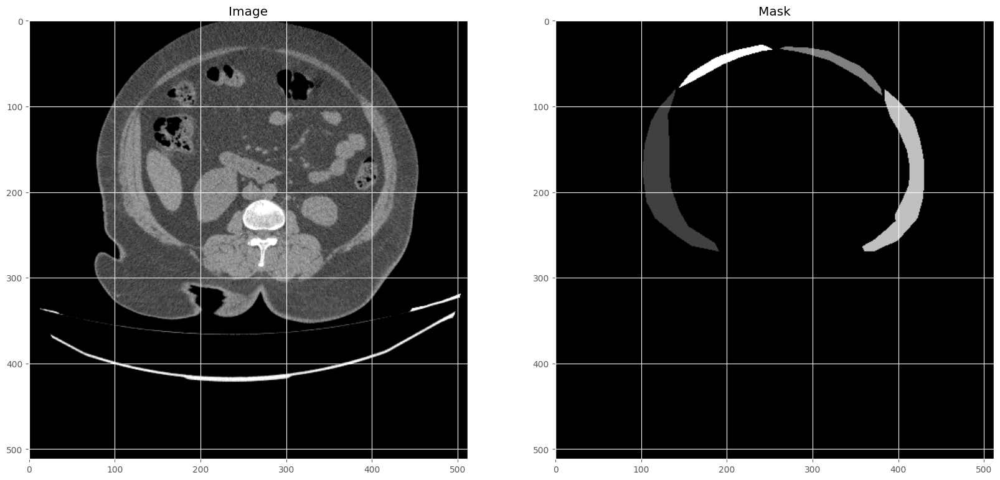

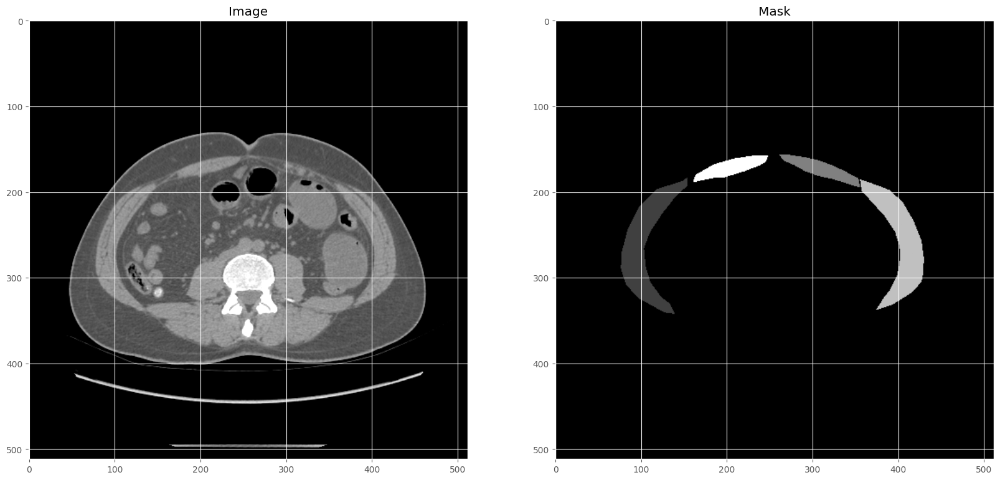

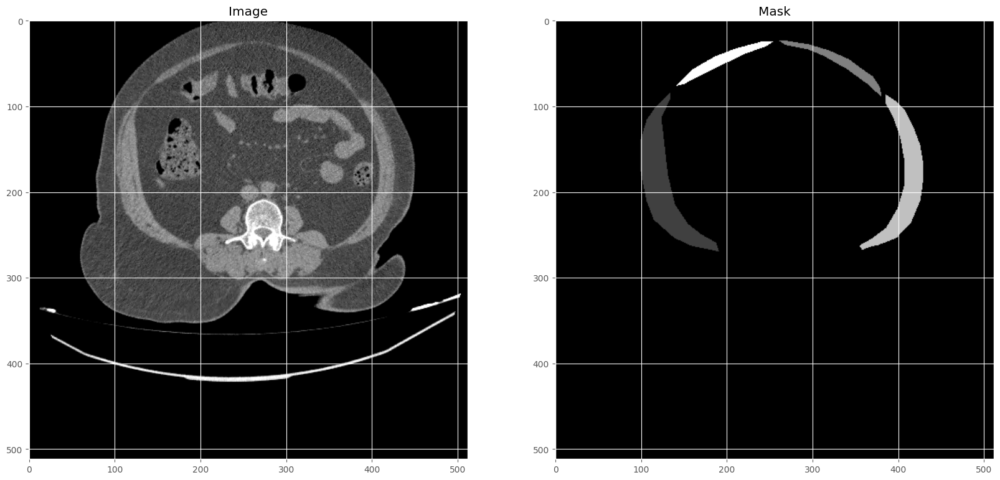

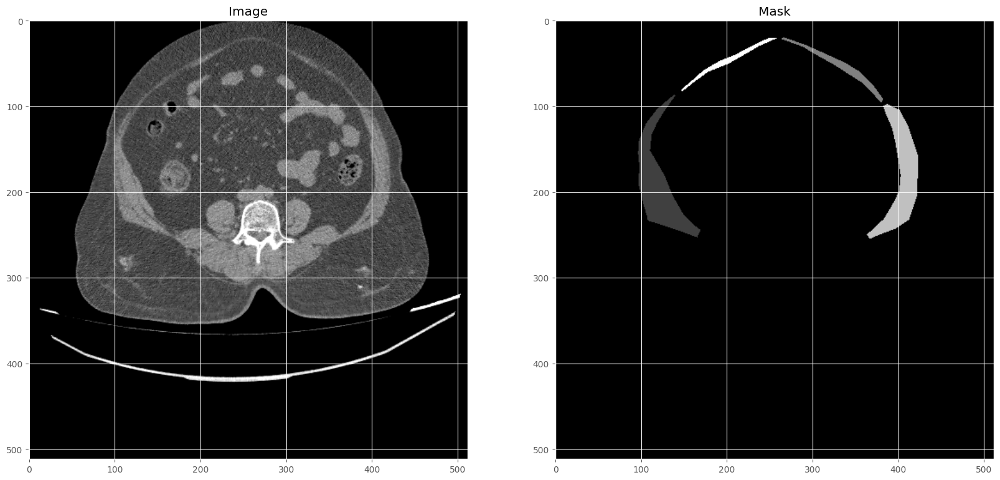

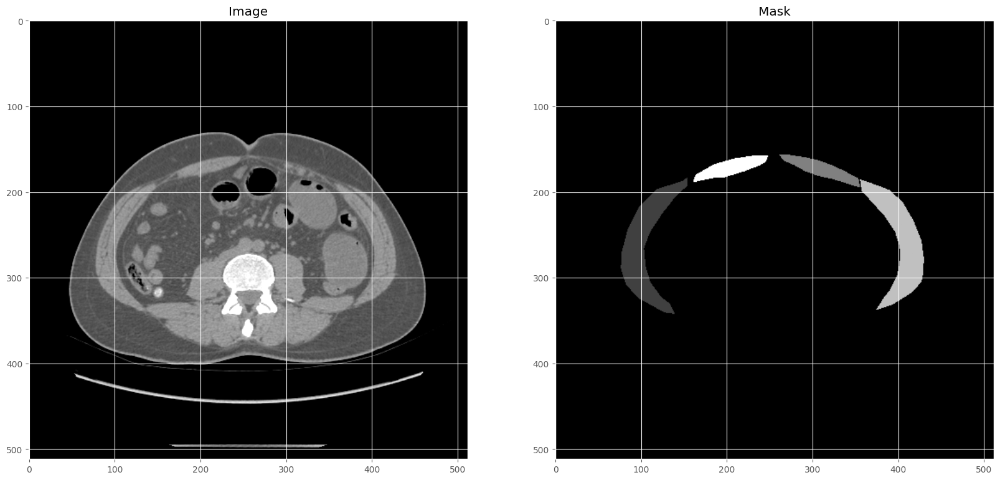

In [21]:
pre_visualize(X_train, y_train, train_text)

						Validation 


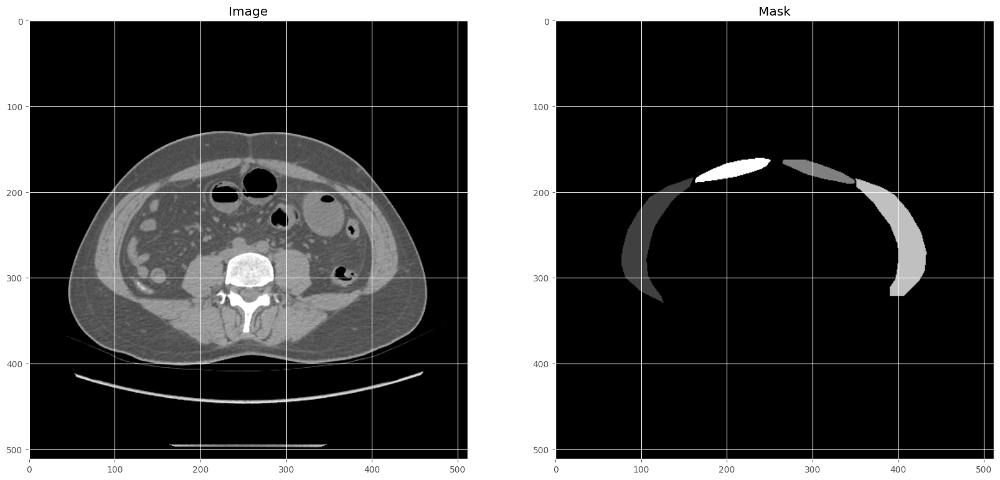

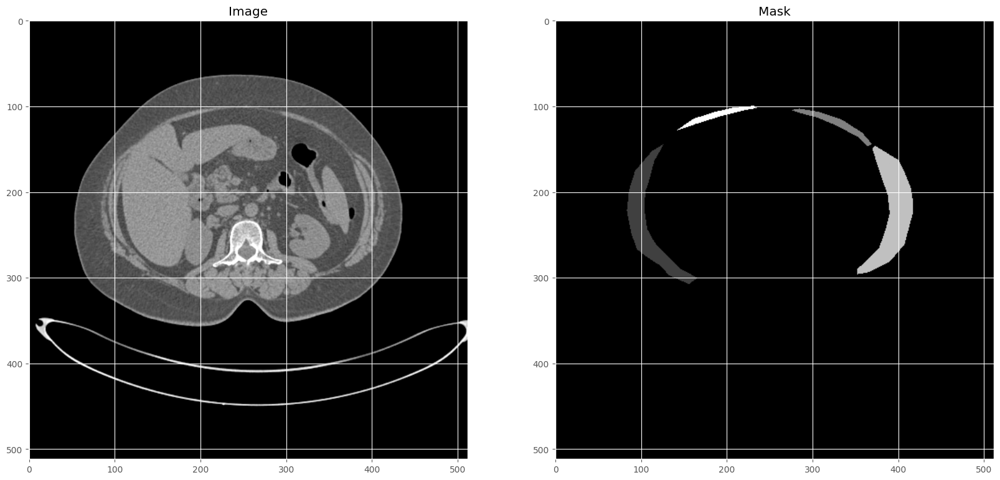

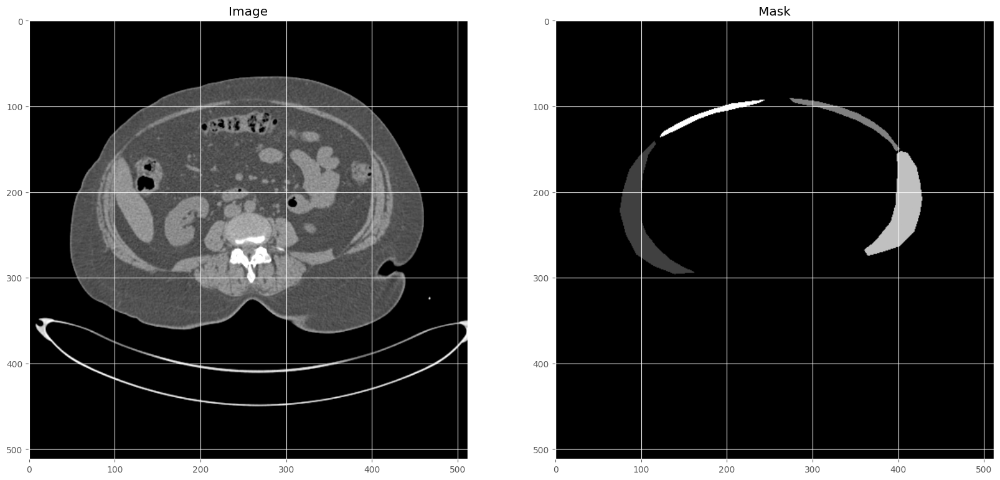

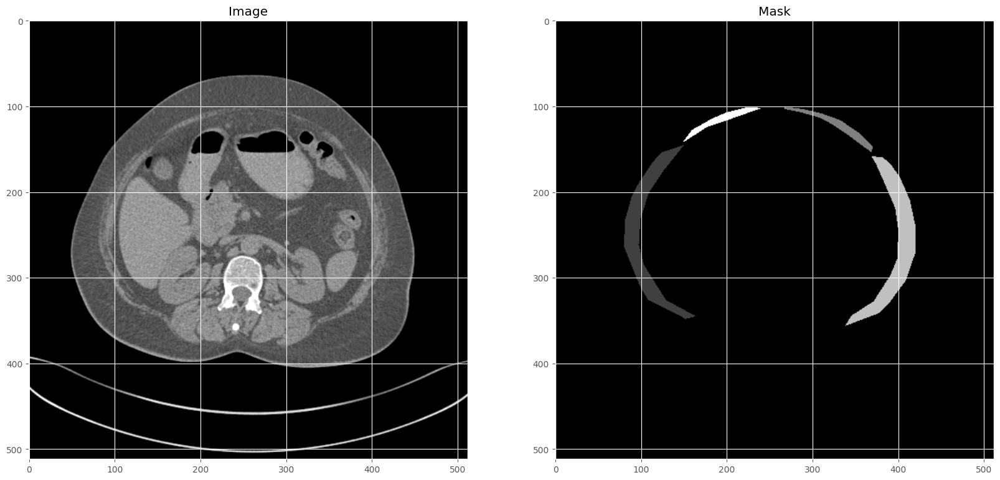

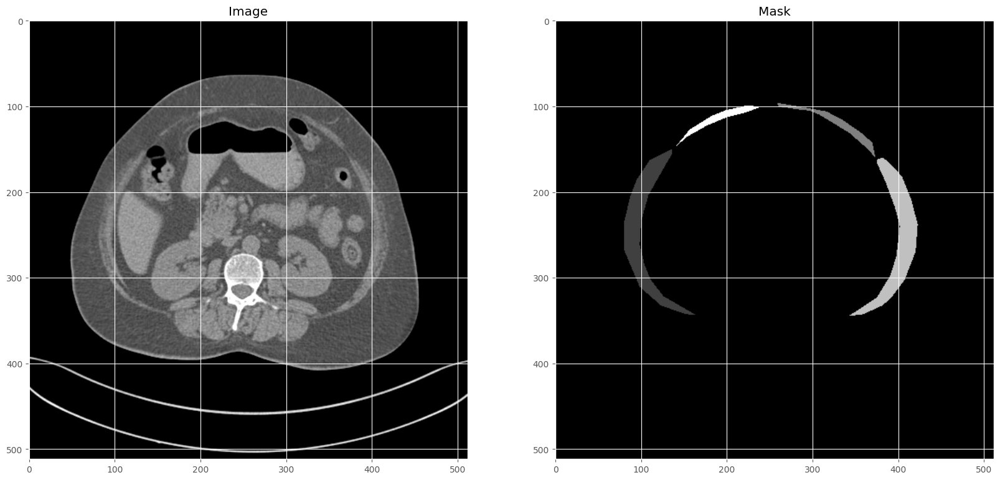

In [25]:
pre_visualize(X_valid, y_valid, valid_text)

							Testing 


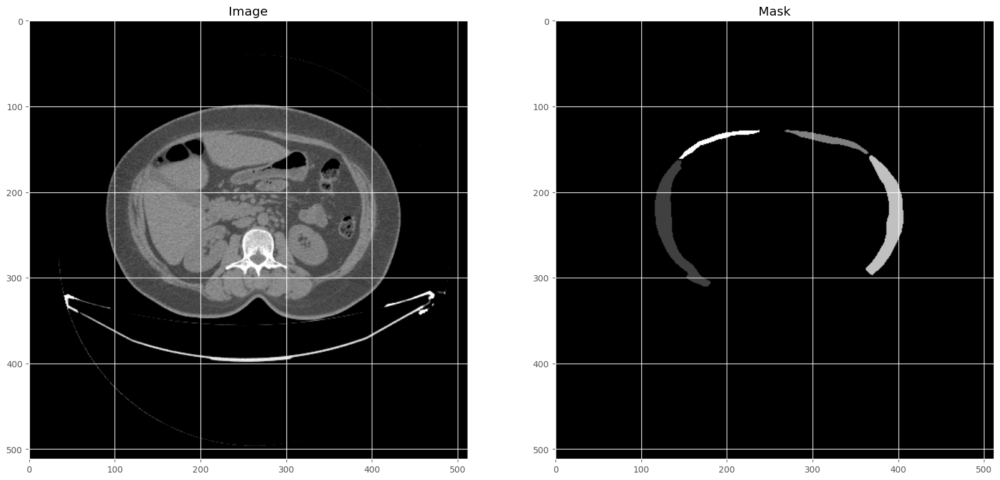

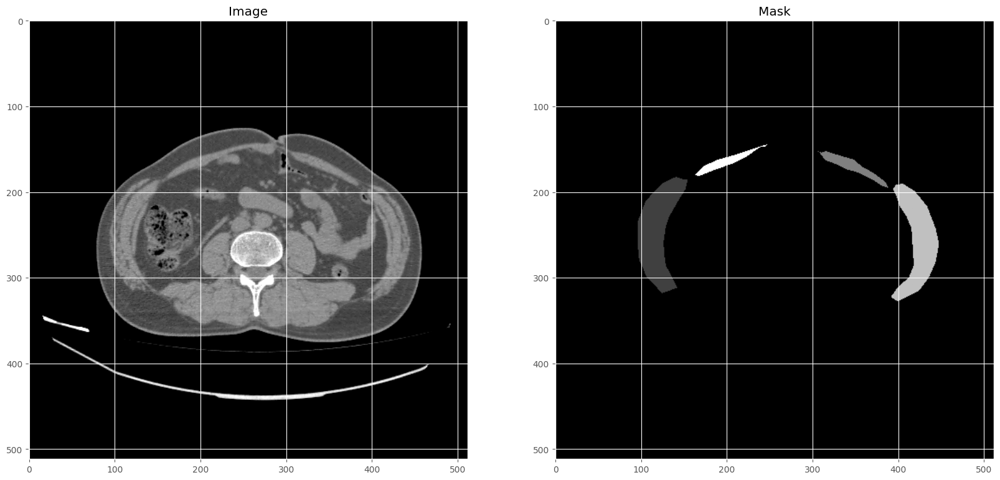

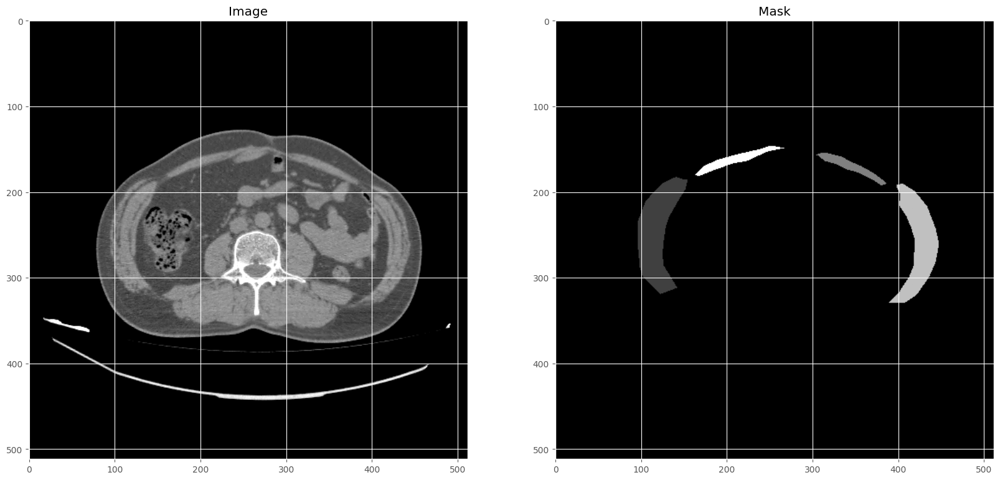

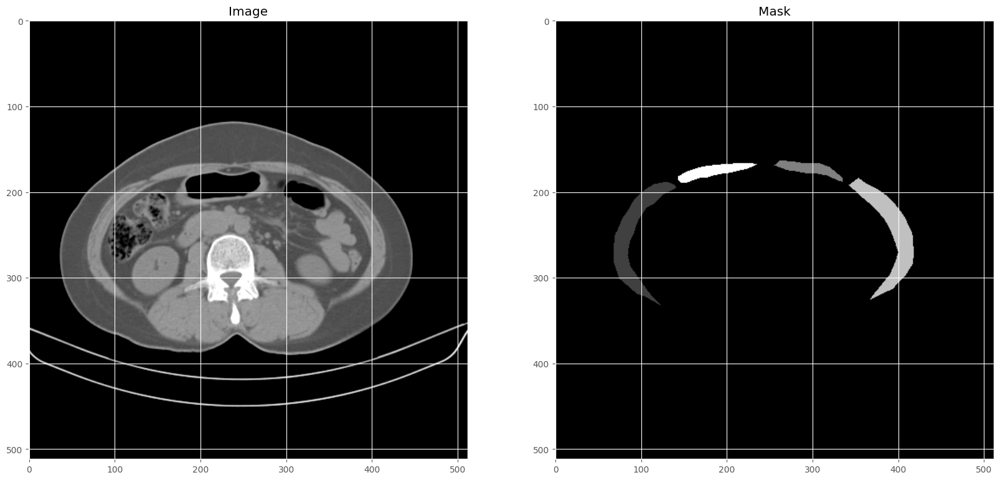

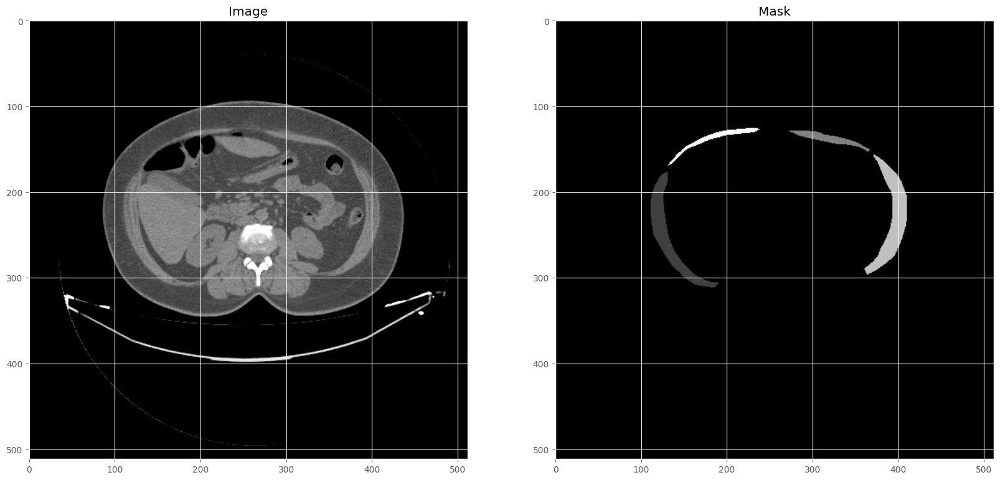

In [26]:
pre_visualize(X_test, y_test, test_text)

In [23]:
print(np.unique(y_train), np.unique(y_valid), np.unique(y_test))

[0 1 2 3 4] [0 1 2 3 4] [0 1 2 3 4]


In [24]:
y_train.shape[3]

1

In [25]:
train_masks_cat = to_categorical(y_train, num_classes=n_classes)
y_train_cat = train_masks_cat.reshape((y_train.shape[0], y_train.shape[1], y_train.shape[2], n_classes))

valid_masks_cat = to_categorical(y_valid, num_classes=n_classes)
y_valid_cat = valid_masks_cat.reshape((y_valid.shape[0], y_valid.shape[1], y_valid.shape[2], n_classes))

test_masks_cat = to_categorical(y_test, num_classes=n_classes)
y_test_cat = test_masks_cat.reshape((y_test.shape[0], y_test.shape[1], y_test.shape[2], n_classes))




#test_masks_cat = to_categorical(y_test, num_classes=n_classes)
#y_test_cat = test_masks_cat.reshape((y_test.shape[0], y_test.shape[1], y_test.shape[2], n_classes))

In [30]:
class_weights = class_weight.compute_class_weight('balanced',
                                                 classes = np.unique(y_encoded),
                                                 y = y_encoded)
print("Class weights are...:", class_weights)


Class weights are...: [ 0.20746934 13.65128841 52.71054486 14.48321784 53.36024318]


In [26]:
def conv2d_block(input_tensor, n_filters, kernel_size = 3, batchnorm = True):
    """Function to add 2 convolutional layers with the parameters passed to it"""
    # first layer
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    # second layer
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same')(x)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    return x

In [27]:
def get_unet(input_img, n_filters = 16, dropout = 0.1, batchnorm = True, n_classes = 5):
    """Function to define the UNET Model"""
    # Contracting Path
    c1 = conv2d_block(input_img, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)
    p1 = MaxPooling2D((2, 2))(c1)
    p1 = Dropout(dropout)(p1) 
    
    c2 = conv2d_block(p1, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)
    p2 = MaxPooling2D((2, 2))(c2)
    p2 = Dropout(dropout)(p2)
    
    c3 = conv2d_block(p2, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)
    p3 = MaxPooling2D((2, 2))(c3)
    p3 = Dropout(dropout)(p3)
    
    c4 = conv2d_block(p3, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)
    p4 = MaxPooling2D((2, 2))(c4)
    p4 = Dropout(dropout)(p4)
    
    c5 = conv2d_block(p4, n_filters * 16, kernel_size = 3, batchnorm = batchnorm)
    p5 = MaxPooling2D((2, 2))(c5)
    p5 = Dropout(dropout)(p5)
    
    c6 = conv2d_block(p5, n_filters * 32, kernel_size = 3, batchnorm = batchnorm)
    p6 = MaxPooling2D((2, 2))(c6)
    p6 = Dropout(dropout)(p6)
    
    c7 = conv2d_block(p6, n_filters = n_filters * 64, kernel_size = 3, batchnorm = batchnorm)
    
    # Expansive Path
    
    u8 = Conv2DTranspose(n_filters * 32, (3, 3), strides = (2, 2), padding = 'same')(c7)
    u8 = concatenate([u8, c6])
    u8 = Dropout(dropout)(u8)
    c8 = conv2d_block(u8, n_filters * 32, kernel_size = 3, batchnorm = batchnorm)
    
    u9 = Conv2DTranspose(n_filters * 16, (3, 3), strides = (2, 2), padding = 'same')(c8)
    u9 = concatenate([u9, c5])
    u9 = Dropout(dropout)(u9)
    c9 = conv2d_block(u9, n_filters * 16, kernel_size = 3, batchnorm = batchnorm)
    
    u10 = Conv2DTranspose(n_filters * 8, (3, 3), strides = (2, 2), padding = 'same')(c9)
    u10 = concatenate([u10, c4])
    u10 = Dropout(dropout)(u10)
    c10 = conv2d_block(u10, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)
    
    u11 = Conv2DTranspose(n_filters * 4, (3, 3), strides = (2, 2), padding = 'same')(c10)
    u11 = concatenate([u11, c3])
    u11 = Dropout(dropout)(u11)
    c11 = conv2d_block(u11, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)
    
    u12 = Conv2DTranspose(n_filters * 2, (3, 3), strides = (2, 2), padding = 'same')(c11)
    u12 = concatenate([u12, c2])
    u12 = Dropout(dropout)(u12)
    c12 = conv2d_block(u12, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)
    
    u13 = Conv2DTranspose(n_filters * 1, (3, 3), strides = (2, 2), padding = 'same')(c12)
    u13 = concatenate([u13, c1])
    u13 = Dropout(dropout)(u13)
    c13 = conv2d_block(u13, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)
    
    outputs = Conv2D(n_classes, (1, 1), activation='softmax')(c13)
    model = Model(inputs=[input_img], outputs=[outputs])
    return model

In [28]:
def dice_coef(y_true, y_pred, smooth=1):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)


def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)


def tversky(y_true, y_pred, smooth=1, alpha=0.7):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1 - y_pred_pos))
    false_pos = K.sum((1 - y_true_pos) * y_pred_pos)
    return (true_pos + smooth) / (true_pos + alpha * false_neg + (1 - alpha) * false_pos + smooth)


def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true, y_pred)


def focal_tversky_loss(y_true, y_pred, gamma=0.75):
    tv = tversky(y_true, y_pred)
    return K.pow((1 - tv), gamma)

In [28]:
input_img = Input((im_height, im_width, 1), name='img')
model = get_unet(input_img, n_filters=16, dropout=0.1, batchnorm=True, n_classes = 5)
model.compile(optimizer=Adam(), loss= tversky_loss, metrics=["accuracy"])

In [29]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 img (InputLayer)               [(None, 512, 512, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 16  160         ['img[0][0]']                    
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 512, 512, 16  64         ['conv2d[0][0]']                 
 alization)                     )                                                             

In [30]:
callbacks = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('MultiClass_TverskyLoss.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

In [44]:
y_valid_cat.shape

(46, 512, 512, 5)

In [45]:
results = model.fit(X_train, y_train_cat, batch_size=16, epochs=80, callbacks=callbacks,\
                    validation_data=(X_valid, y_valid_cat))

Epoch 1/80
12/12 [==============================] - ETA: 0s - loss: 0.6724 - accuracy: 0.4880
Epoch 1: val_loss improved from inf to 0.53354, saving model to MultiClass_TverskyLoss.h5
12/12 [==============================] - 81s 3s/step - loss: 0.6724 - accuracy: 0.4880 - val_loss: 0.5335 - val_accuracy: 0.5214 - lr: 0.0010
Epoch 2/80
12/12 [==============================] - ETA: 0s - loss: 0.5379 - accuracy: 0.7542
Epoch 2: val_loss improved from 0.53354 to 0.37600, saving model to MultiClass_TverskyLoss.h5
12/12 [==============================] - 14s 1s/step - loss: 0.5379 - accuracy: 0.7542 - val_loss: 0.3760 - val_accuracy: 0.6672 - lr: 0.0010
Epoch 3/80
12/12 [==============================] - ETA: 0s - loss: 0.4523 - accuracy: 0.8966
Epoch 3: val_loss did not improve from 0.37600
12/12 [==============================] - 14s 1s/step - loss: 0.4523 - accuracy: 0.8966 - val_loss: 0.4658 - val_accuracy: 0.5884 - lr: 0.0010
Epoch 4/80
12/12 [==============================] - ETA: 0s -

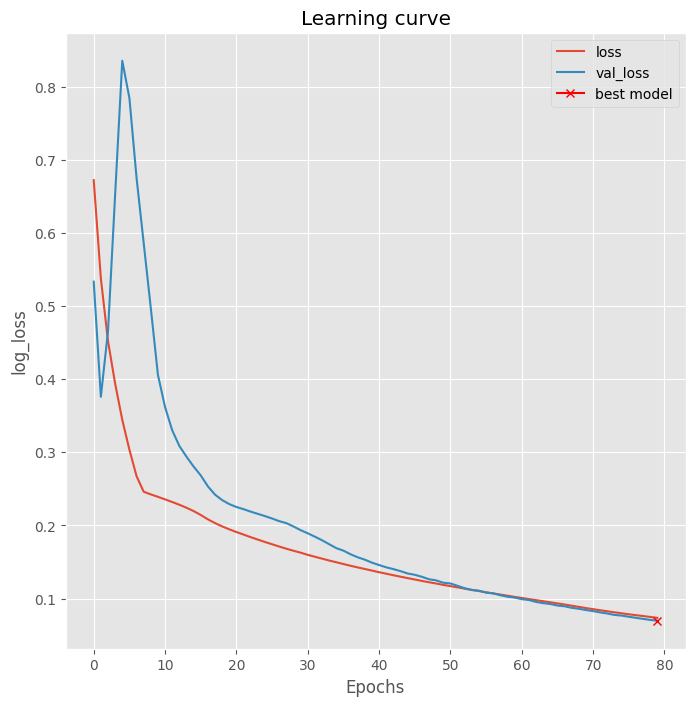

In [46]:

#plotting Learning curve ( log_loss vs epochs)
plt.figure(figsize=(8, 8))
plt.title("Learning curve")
plt.plot(results.history["loss"], label="loss")
plt.plot(results.history["val_loss"], label="val_loss")
plt.plot( np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("log_loss")
plt.legend();

In [ ]:
#!unzip "/content/drive/My Drive/Dataset_Capstone/final_model80_all-tgs-salt.h5.zip"

Archive:  /content/drive/My Drive/Dataset_Capstone/final_model80_all-tgs-salt.h5.zip
  inflating: final_model80_all-tgs-salt.h5  


In [31]:
# load the best model
model.load_weights('MultiClass_TverskyLoss.h5')

In [32]:
# Evaluate on validation set (this must be equals to the best log_loss)
model.evaluate(X_train, y_train_cat, verbose=1)
model.evaluate(X_valid, y_valid_cat, verbose=1)
model.evaluate(X_test, y_test_cat, verbose =1)
#model.evaluate(X_test, y_test, verbose=1)

1/1 [==============================] - 12s 12s/step - loss: 0.0813 - accuracy: 0.9819


[0.08128952980041504, 0.981917142868042]

In [33]:
# Predict on train, val and test
preds_train = model.predict(X_train, verbose=1)
pred_train_argmax=np.argmax(preds_train, axis=3)

preds_val = model.predict(X_valid, verbose=1)
pred_val_argmax=np.argmax(preds_val, axis=3)

preds_test = model.predict(X_test, verbose=1)
pred_test_argmax=np.argmax(preds_test, axis=3)

#preds_test = model.predict(X_test, verbose=1)

1/1 [==============================] - 0s 34ms/step


In [35]:
def classwiseIOU(y,y_argmax):
  #Using built in keras function
  from keras.metrics import MeanIoU
  n_classes = 5
  IOU_keras = MeanIoU(num_classes=n_classes)  
  IOU_keras.update_state(y[:,:,:,0], y_argmax)
  print("Mean IoU =", IOU_keras.result().numpy())
  
  #To calculate I0U for each class...
  values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
  print(values)
  class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[0,3]+values[0,4] + values[1,0]+ values[2,0]+ values[3,0]+values[4,0])
  class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[1,3]+values[1,4] + values[0,1]+ values[2,1]+ values[3,1]+values[4,1])
  class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[2,3]+values[2,4] + values[0,2]+ values[1,2]+ values[3,2]+values[4,2])
  class4_IoU = values[3,3]/(values[3,3] + values[3,0] + values[3,1] + values[3,2]+values[3,4] + values[0,3]+ values[1,3]+ values[2,3]+values[4,3])
  class5_IoU = values[4,4]/(values[4,4] + values[4,0] + values[4,1] + values[4,2]+values[4,3] + values[0,4]+ values[1,4]+ values[2,4]+values[3,4])
  
  print("IoU for class1 is: ", class1_IoU)
  print("IoU for class2 is: ", class2_IoU)
  print("IoU for class3 is: ", class3_IoU)
  print("IoU for class4 is: ", class4_IoU)
  print("IoU for class5 is: ", class5_IoU)


In [36]:
#Function for viewing plots and predictions
def plot_sample(X, y, preds,text, ix=None):
    """Function to plot the results"""
    print(text) 
    
    for i in range(5) : 
        if ix is None:
            ix = random.randint(0, len(X)-1)
            
        fig, ax = plt.subplots(1, 3, figsize=(25, 15))
        ax[0].imshow(X[ix], cmap='gray')
        ax[0].set_title('Input')

        ax[1].imshow(y[ix].squeeze(),cmap='gray')
        ax[1].set_title('Mask')


        ax[2].imshow(preds[ix].squeeze(),cmap='gray')
        ax[2].set_title('Mask Predicted')
        
        #d_loss = dice_loss(y[ix],preds[ix]).numpy()
        #d_loss = round(d_loss*100, 3)
        
        #i_loss = iou_loss(y[ix],preds[ix]).numpy()
        #i_loss = round(i_loss*100, 3)
        
        #text_1 = "Dice loss of image " + str(ix) +  " = " + str(d_loss) + " %"
        #text_2 = "IoU loss of image " + str(ix) +  " = " + str(i_loss) + " %"
        #plt.figtext(0.4, 0.2, text_1, fontsize=18)
        #plt.figtext(0.4, 0.18, text_2, fontsize=18)
        
        ix = None

In [36]:
classwiseIOU(y_train,pred_train_argmax)

Mean IoU = 0.6086675
[[1.6777216e+07 1.9334000e+04 1.0350000e+03 2.9343000e+04 0.0000000e+00]
 [3.0988000e+04 6.6795300e+05 0.0000000e+00 8.8000000e+01 0.0000000e+00]
 [1.0410300e+05 2.9100000e+02 5.9686000e+04 1.7390000e+04 4.0000000e+00]
 [1.6121000e+04 0.0000000e+00 1.6400000e+02 6.3799000e+05 0.0000000e+00]
 [9.1711000e+04 5.4666000e+04 2.9339000e+04 2.1200000e+03 1.4280000e+03]]
IoU for class1 is:  0.9828566
IoU for class2 is:  0.86374724
IoU for class3 is:  0.2815218
IoU for class4 is:  0.9072461
IoU for class5 is:  0.007965728


In [37]:
classwiseIOU(y_valid,pred_val_argmax)

Mean IoU = 0.6051434
[[1.1626676e+07 5.4260000e+03 4.4100000e+02 7.1930000e+03 0.0000000e+00]
 [9.0790000e+03 1.5984900e+05 0.0000000e+00 1.3000000e+01 0.0000000e+00]
 [2.5244000e+04 6.8000000e+01 1.3781000e+04 4.2250000e+03 0.0000000e+00]
 [5.7780000e+03 0.0000000e+00 3.5000000e+01 1.5802500e+05 0.0000000e+00]
 [2.2261000e+04 1.2809000e+04 6.8440000e+03 5.5400000e+02 3.2300000e+02]]
IoU for class1 is:  0.99355483
IoU for class2 is:  0.8536936
IoU for class3 is:  0.2721474
IoU for class4 is:  0.8987732
IoU for class5 is:  0.0075483164


In [38]:
classwiseIOU(y_test,pred_test_argmax)

Mean IoU = 0.48883706
[[6.545064e+06 1.043200e+04 4.173000e+03 1.862400e+04 1.200000e+01]
 [2.192400e+04 7.456100e+04 1.590000e+02 1.200000e+01 5.000000e+00]
 [1.188900e+04 7.500000e+01 7.868000e+03 4.434000e+03 2.000000e+00]
 [2.761400e+04 0.000000e+00 3.740000e+02 6.490100e+04 0.000000e+00]
 [1.341900e+04 5.393000e+03 4.513000e+03 1.940000e+02 1.020000e+02]]
IoU for class1 is:  0.98375404
IoU for class2 is:  0.66240525
IoU for class3 is:  0.23495685
IoU for class4 is:  0.5587544
IoU for class5 is:  0.0043147206


						Training 


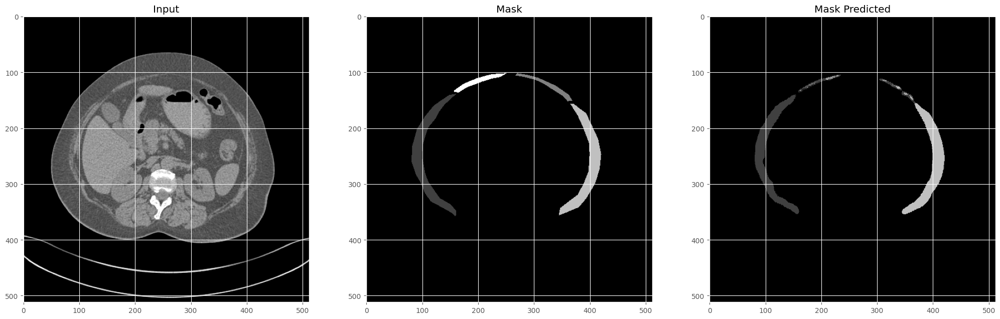

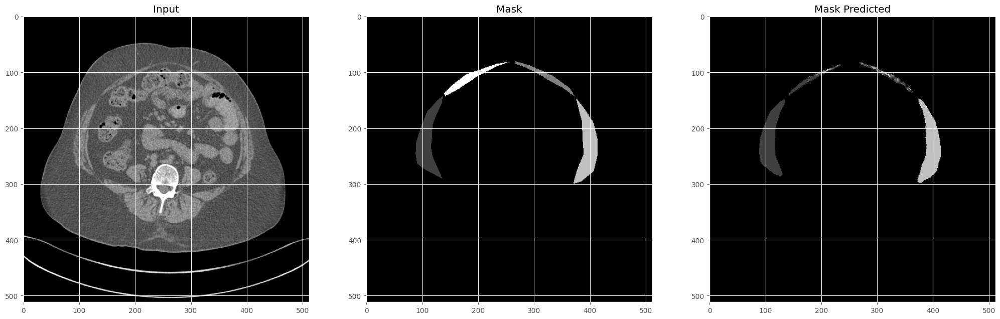

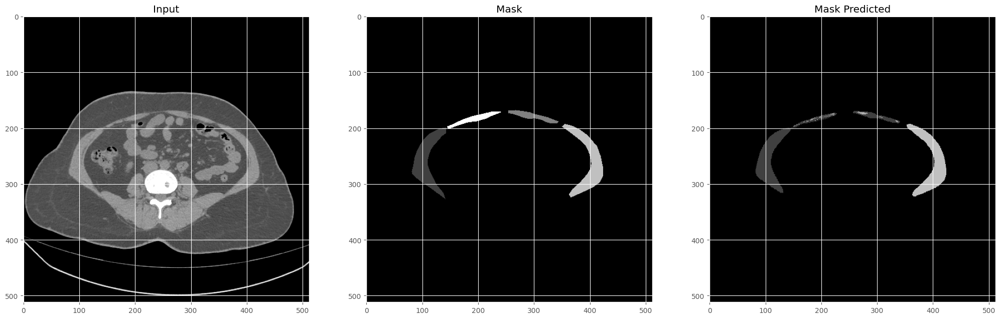

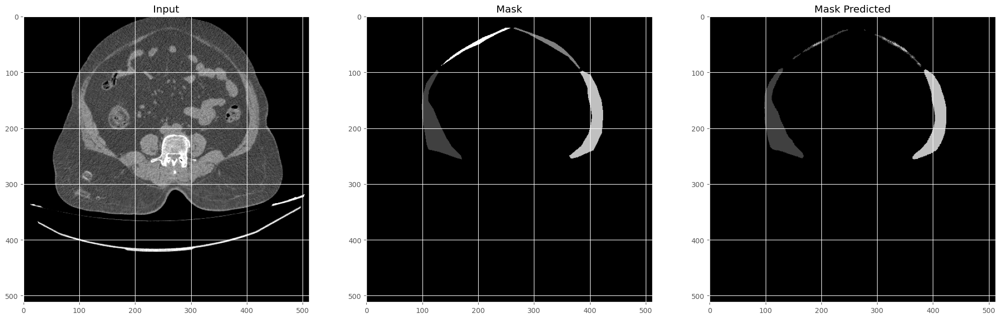

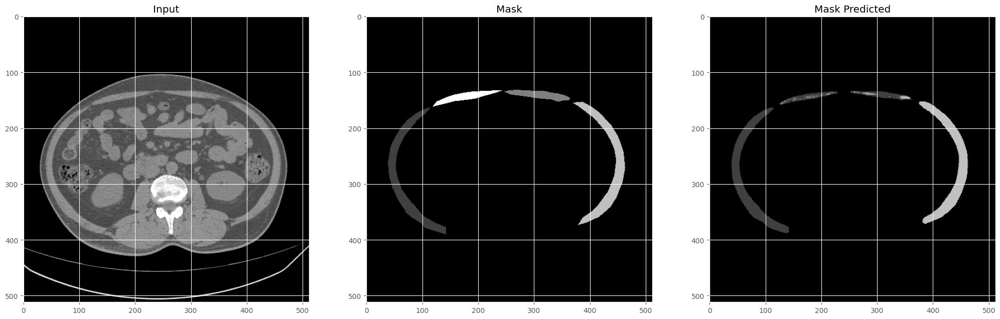

In [39]:
plot_sample(X_train, y_train, pred_train_argmax, train_text)

						Validation 


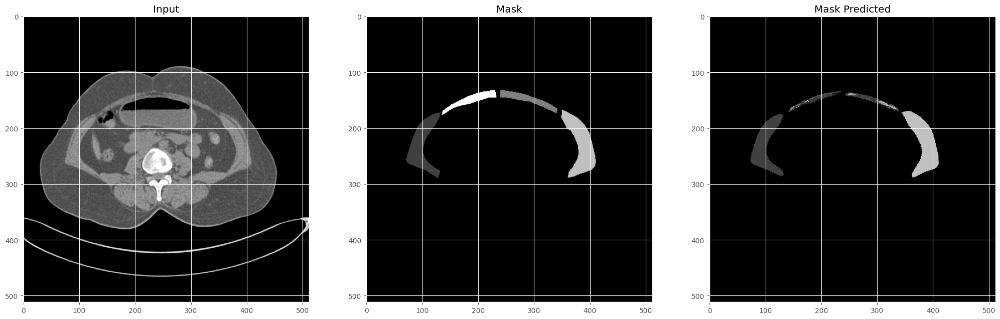

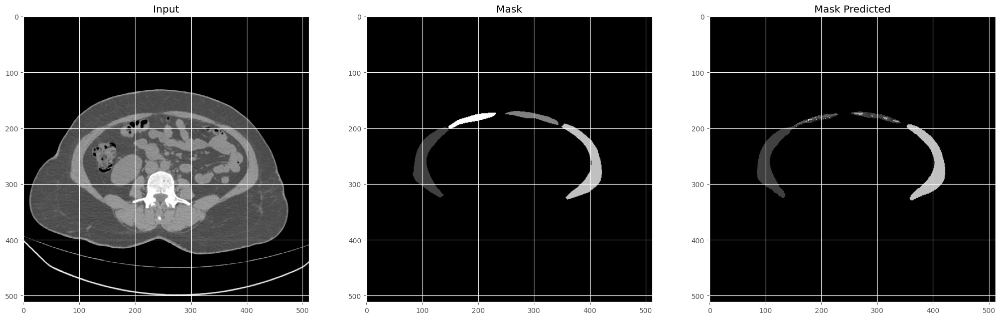

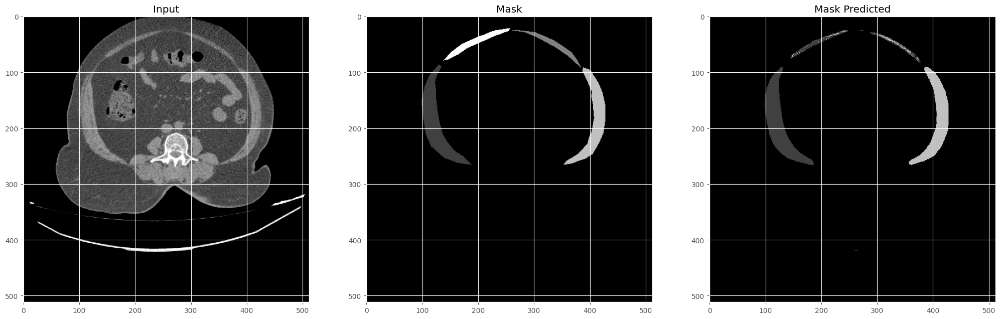

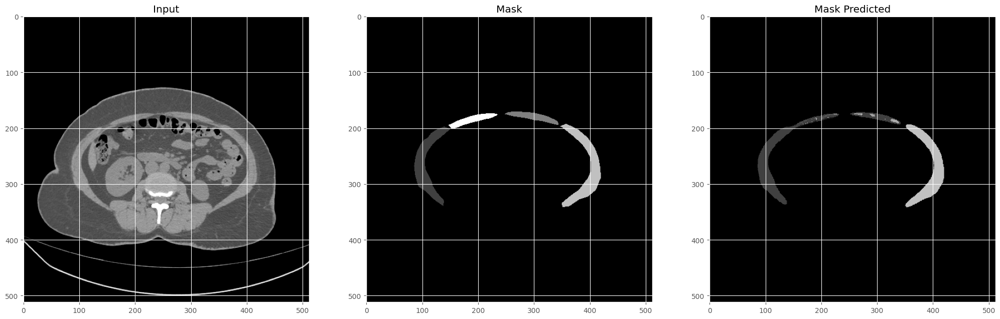

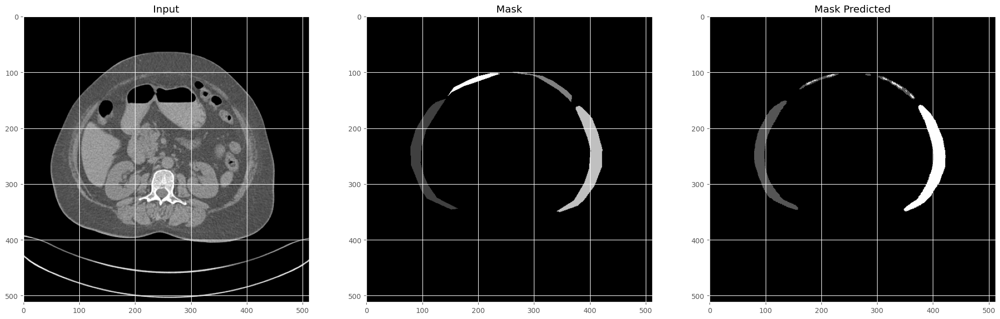

In [40]:
plot_sample(X_valid, y_valid, pred_val_argmax, valid_text)

							Testing 


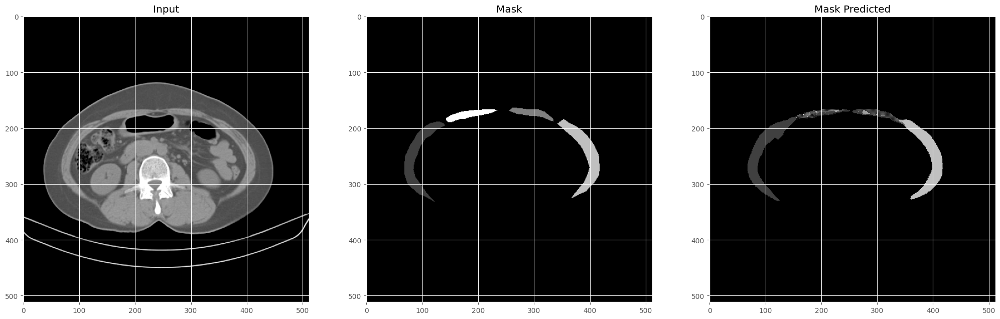

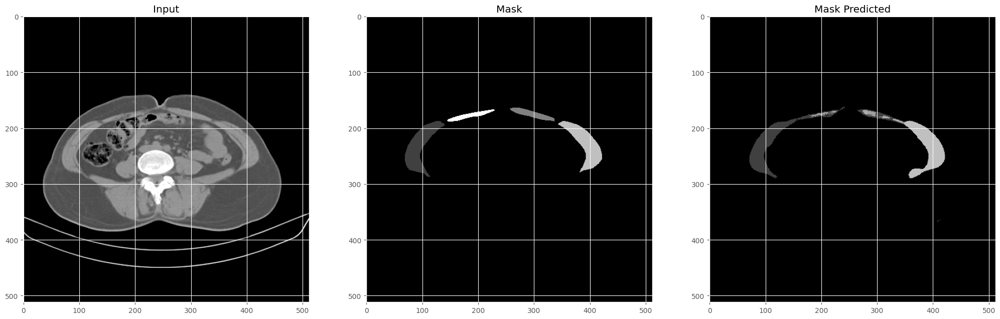

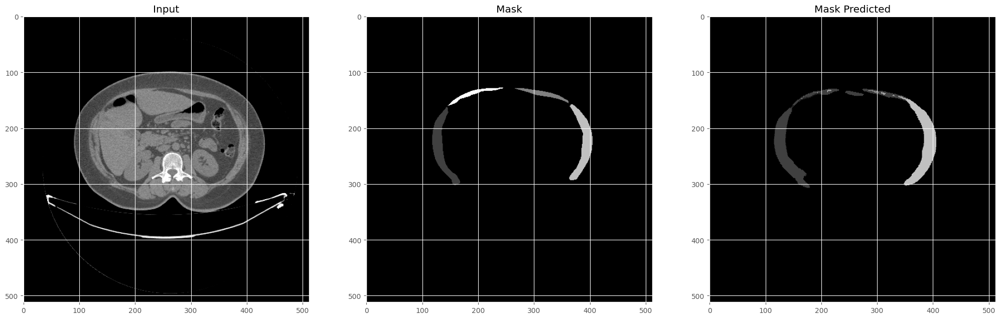

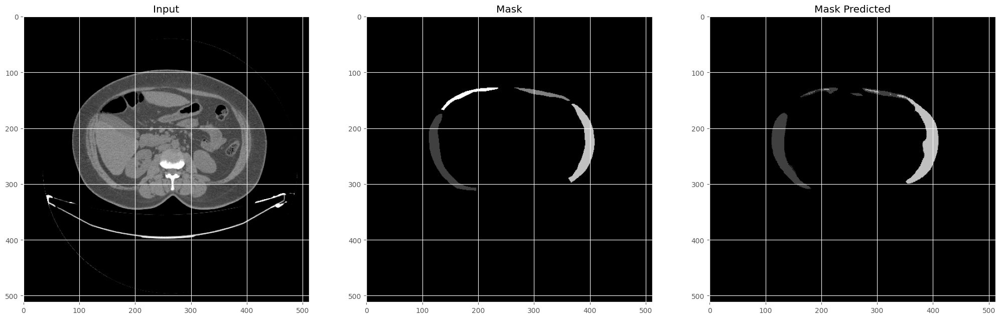

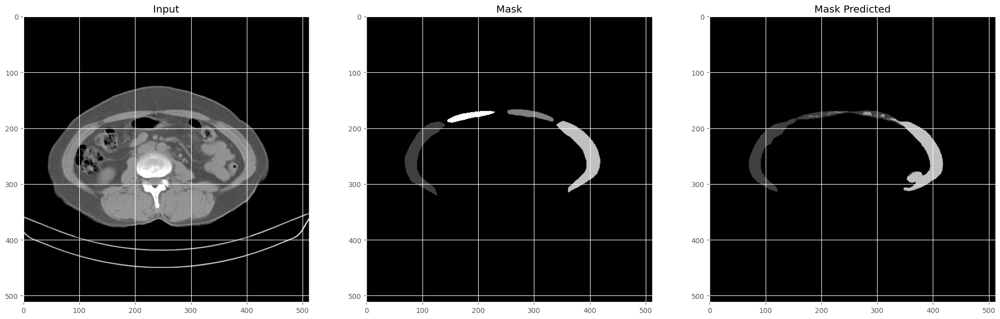

In [41]:
plot_sample(X_test, y_test, pred_test_argmax, test_text)

In [48]:
import shutil
colab_link = "/content/MultiClass_TverskyLoss.h5"
gdrive_link = "/content/drive/My Drive/MultiClass_UNet/Anvesh/Extension1_Multiclass/WeightFiles"
shutil.copy(colab_link, gdrive_link)

'/content/drive/My Drive/MultiClass_UNet/Anvesh/Extension1_Multiclass/WeightFiles/MultiClass_TverskyLoss.h5'

100%|█████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 302.26it/s]

360 91 26


Focal tversky Loss


In [29]:
input_img = Input((im_height, im_width, 1), name='img')
model = get_unet(input_img, n_filters=16, dropout=0.1, batchnorm=True, n_classes = 5)
model.compile(optimizer=Adam(), loss= focal_tversky_loss, metrics=["accuracy"])

In [30]:
callbacks = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('MultiClass_FocalTverskyLoss.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

In [47]:
results = model.fit(X_train, y_train_cat, batch_size=16, epochs=80, callbacks=callbacks,\
                    validation_data=(X_valid, y_valid_cat))

Epoch 1/80
12/12 [==============================] - ETA: 0s - loss: 0.8372 - accuracy: 0.3223
Epoch 1: val_loss improved from inf to 0.97892, saving model to MultiClass_FocalTverskyLoss.h5
12/12 [==============================] - 71s 2s/step - loss: 0.8372 - accuracy: 0.3223 - val_loss: 0.9789 - val_accuracy: 0.0603 - lr: 0.0010
Epoch 2/80
12/12 [==============================] - ETA: 0s - loss: 0.7602 - accuracy: 0.7690
Epoch 2: val_loss did not improve from 0.97892
12/12 [==============================] - 13s 1s/step - loss: 0.7602 - accuracy: 0.7690 - val_loss: 0.9961 - val_accuracy: 0.0036 - lr: 0.0010
Epoch 3/80
12/12 [==============================] - ETA: 0s - loss: 0.7157 - accuracy: 0.8805
Epoch 3: val_loss did not improve from 0.97892
12/12 [==============================] - 13s 1s/step - loss: 0.7157 - accuracy: 0.8805 - val_loss: 0.9961 - val_accuracy: 0.0037 - lr: 0.0010
Epoch 4/80
12/12 [==============================] - ETA: 0s - loss: 0.6692 - accuracy: 0.9197
Epoch 4: 

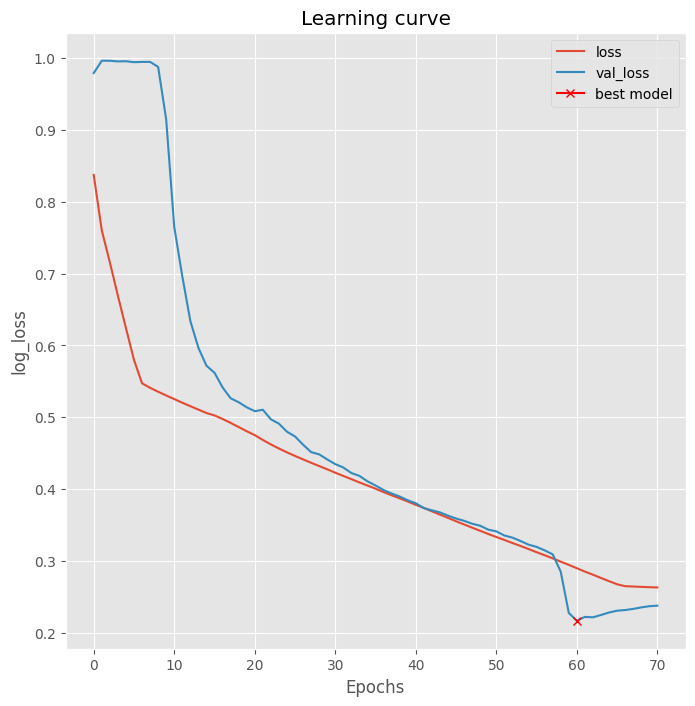

In [48]:
#plotting Learning curve ( log_loss vs epochs)
plt.figure(figsize=(8, 8))
plt.title("Learning curve")
plt.plot(results.history["loss"], label="loss")
plt.plot(results.history["val_loss"], label="val_loss")
plt.plot( np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("log_loss")
plt.legend();

In [31]:
# load the best model
model.load_weights('MultiClass_FocalTverskyLoss.h5')

In [32]:
# Evaluate on validation set (this must be equals to the best log_loss)
model.evaluate(X_train, y_train_cat, verbose=1)
model.evaluate(X_valid, y_valid_cat, verbose=1)
model.evaluate(X_test, y_test_cat, verbose =1)
#model.evaluate(X_test, y_test, verbose=1)

1/1 [==============================] - 11s 11s/step - loss: 0.2143 - accuracy: 0.9636


[0.2142912596464157, 0.9635697603225708]

In [33]:
# Predict on train, val and test
preds_train = model.predict(X_train, verbose=1)
pred_train_argmax=np.argmax(preds_train, axis=3)

preds_val = model.predict(X_valid, verbose=1)
pred_val_argmax=np.argmax(preds_val, axis=3)

preds_test = model.predict(X_test, verbose=1)
pred_test_argmax=np.argmax(preds_test, axis=3)


1/1 [==============================] - 0s 54ms/step


In [34]:
#Using built in keras function
from keras.metrics import MeanIoU
n_classes = 5
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(y_train[:,:,:,0], pred_train_argmax)
print("Mean IoU =", IOU_keras.result().numpy())


#To calculate I0U for each class...
values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
print(values)
class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[0,3]+values[0,4] + values[1,0]+ values[2,0]+ values[3,0]+values[4,0])
class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[1,3]+values[1,4] + values[0,1]+ values[2,1]+ values[3,1]+values[4,1])
class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[2,3]+values[2,4] + values[0,2]+ values[1,2]+ values[3,2]+values[4,2])
class4_IoU = values[3,3]/(values[3,3] + values[3,0] + values[3,1] + values[3,2]+values[3,4] + values[0,3]+ values[1,3]+ values[2,3]+values[4,3])
class5_IoU = values[4,4]/(values[4,4] + values[4,0] + values[4,1] + values[4,2]+values[4,3] + values[0,4]+ values[1,4]+ values[2,4]+values[3,4])

print("IoU for class1 is: ", class1_IoU)
print("IoU for class2 is: ", class2_IoU)
print("IoU for class3 is: ", class3_IoU)
print("IoU for class4 is: ", class4_IoU)
print("IoU for class4 is: ", class5_IoU)

Mean IoU = 0.19375756
[[1.6777216e+07 0.0000000e+00 1.0000000e+00 9.5647000e+04 0.0000000e+00]
 [6.5560700e+05 5.3640000e+03 0.0000000e+00 3.8058000e+04 0.0000000e+00]
 [1.3265500e+05 0.0000000e+00 0.0000000e+00 4.8819000e+04 0.0000000e+00]
 [6.1047300e+05 0.0000000e+00 0.0000000e+00 4.3802000e+04 0.0000000e+00]
 [1.2188600e+05 0.0000000e+00 9.0000000e+00 5.7369000e+04 0.0000000e+00]]
IoU for class1 is:  0.91212815
IoU for class2 is:  0.0076735015
IoU for class3 is:  0.0
IoU for class4 is:  0.04898632
IoU for class4 is:  0.0


In [37]:
classwiseIOU(y_valid,pred_val_argmax)

Mean IoU = 0.20088473
[[1.1611143e+07 0.0000000e+00 1.0000000e+00 2.8592000e+04 0.0000000e+00]
 [1.5943300e+05 1.0420000e+03 0.0000000e+00 8.4660000e+03 0.0000000e+00]
 [3.6380000e+04 0.0000000e+00 0.0000000e+00 6.9380000e+03 0.0000000e+00]
 [1.5671900e+05 0.0000000e+00 0.0000000e+00 7.1190000e+03 0.0000000e+00]
 [3.2722000e+04 0.0000000e+00 5.0000000e+00 1.0064000e+04 0.0000000e+00]]
IoU for class1 is:  0.9655844
IoU for class2 is:  0.0061678337
IoU for class3 is:  0.0
IoU for class4 is:  0.03267125
IoU for class5 is:  0.0


In [38]:
classwiseIOU(y_test,pred_test_argmax)

Mean IoU = 0.21586978
[[6.551576e+06 7.300000e+01 2.000000e+00 2.665400e+04 0.000000e+00]
 [8.433600e+04 2.458000e+03 0.000000e+00 9.867000e+03 0.000000e+00]
 [8.411000e+03 0.000000e+00 0.000000e+00 1.585700e+04 0.000000e+00]
 [7.947800e+04 0.000000e+00 0.000000e+00 1.341100e+04 0.000000e+00]
 [1.109900e+04 0.000000e+00 2.100000e+01 1.250100e+04 0.000000e+00]]
IoU for class1 is:  0.96893454
IoU for class2 is:  0.025409887
IoU for class3 is:  0.0
IoU for class4 is:  0.08500456
IoU for class5 is:  0.0


						Training 


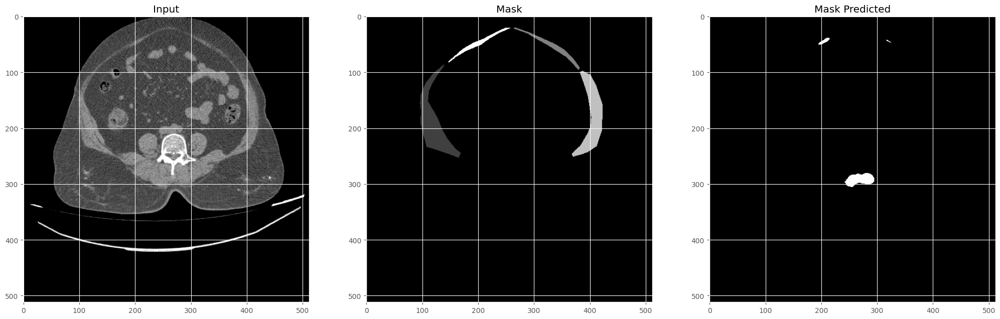

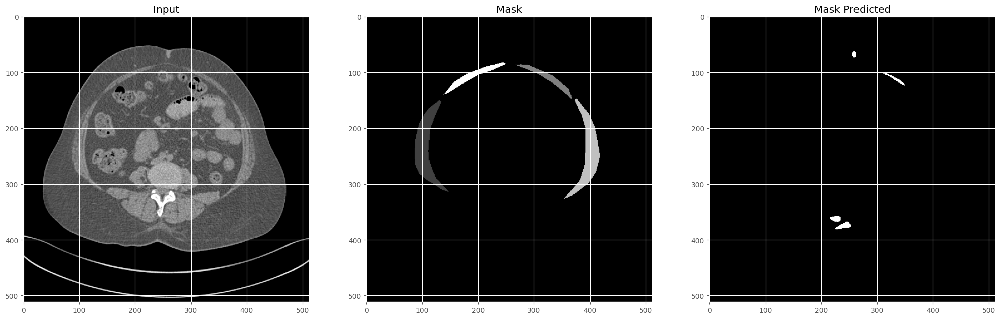

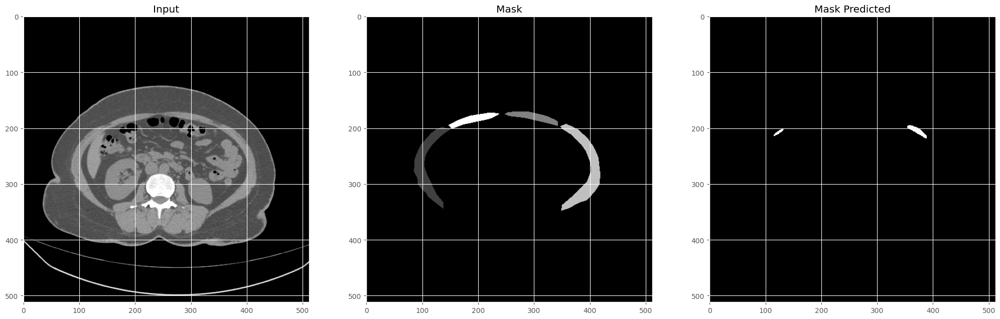

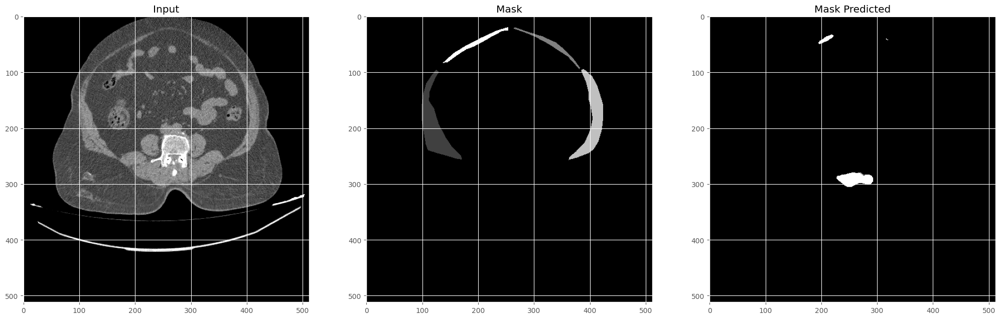

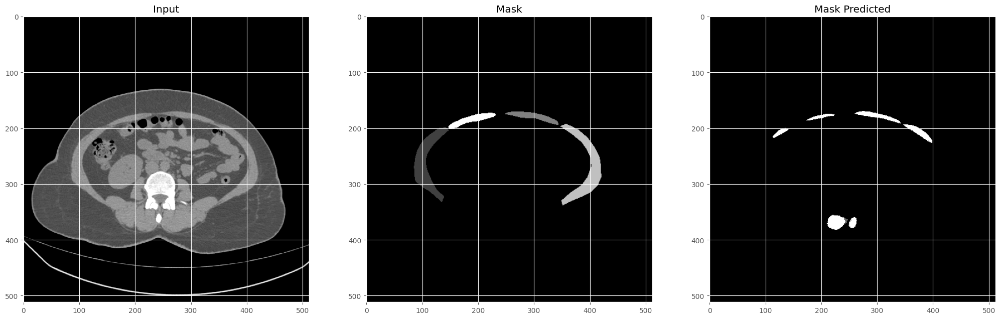

In [39]:
plot_sample(X_train, y_train, pred_train_argmax, train_text)

						Validation 


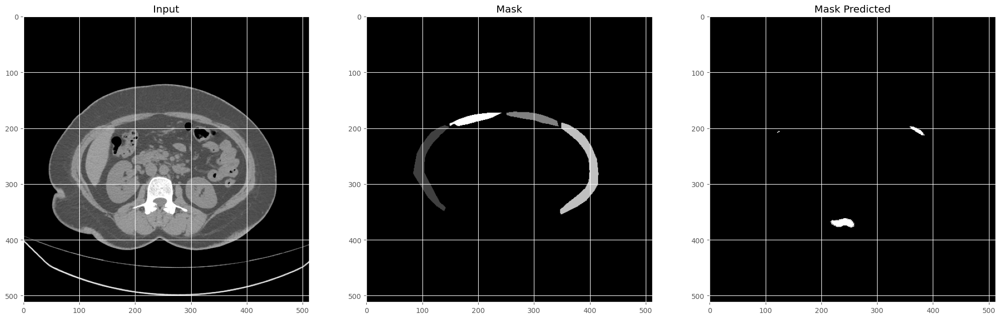

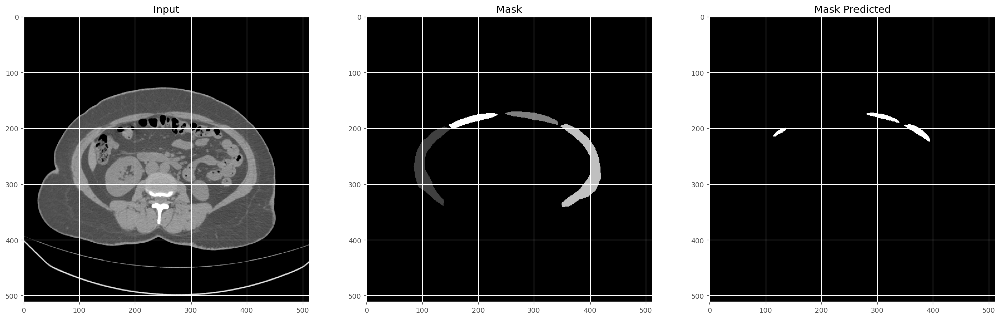

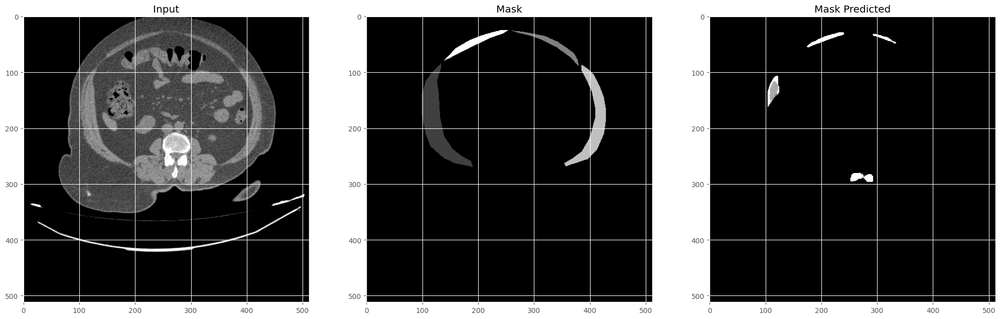

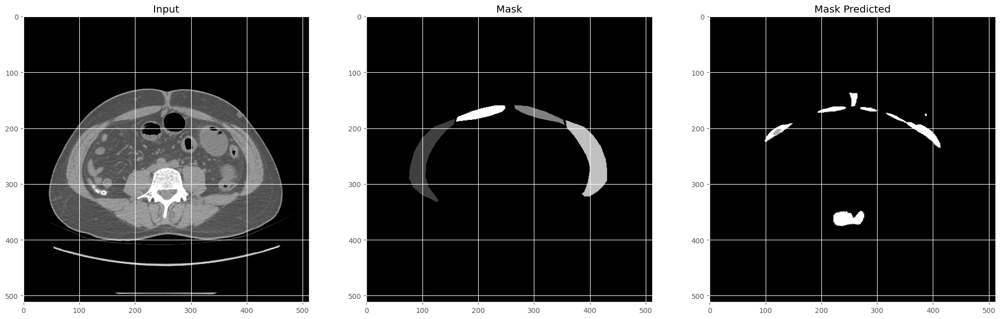

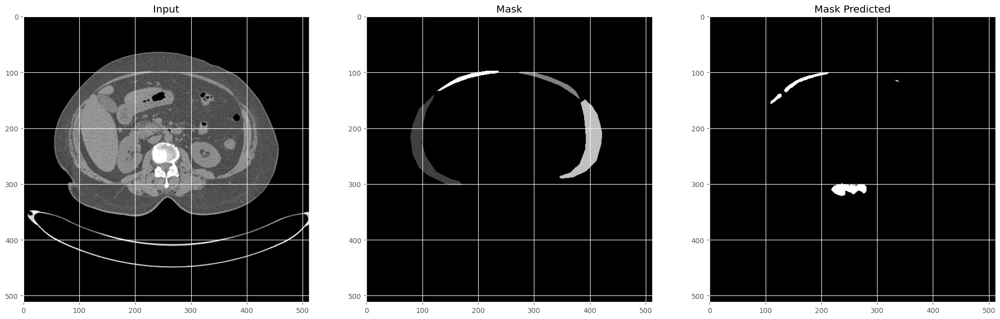

In [40]:
plot_sample(X_valid, y_valid, pred_val_argmax, valid_text)

							Testing 


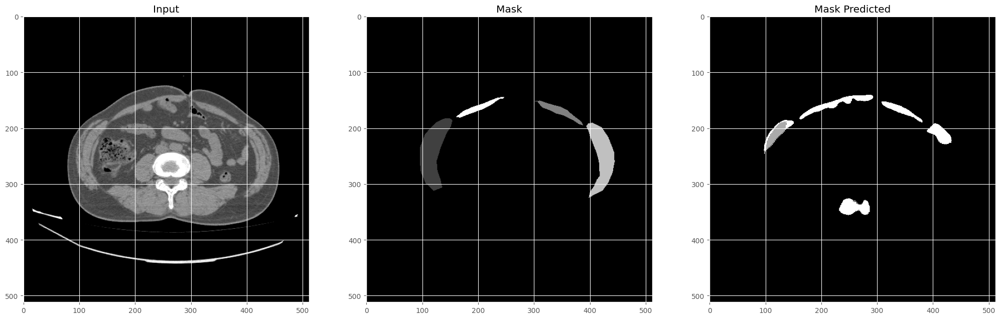

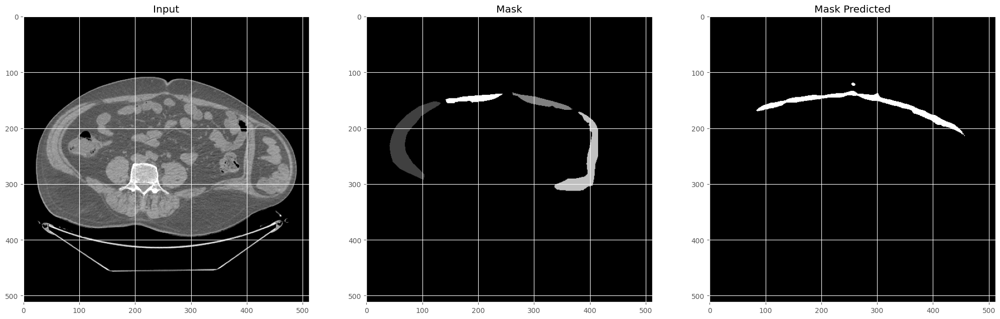

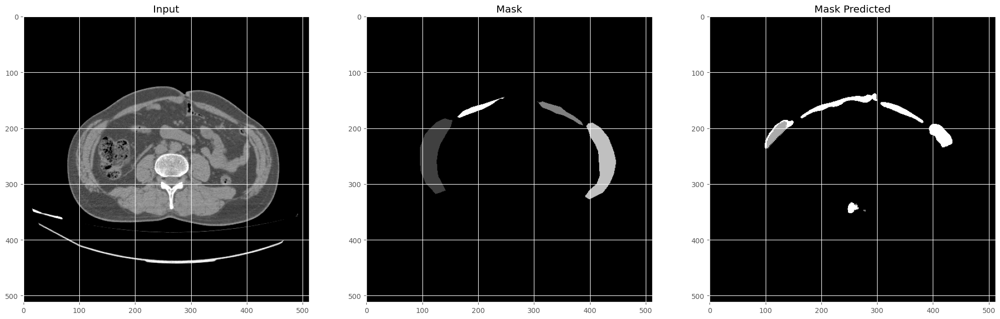

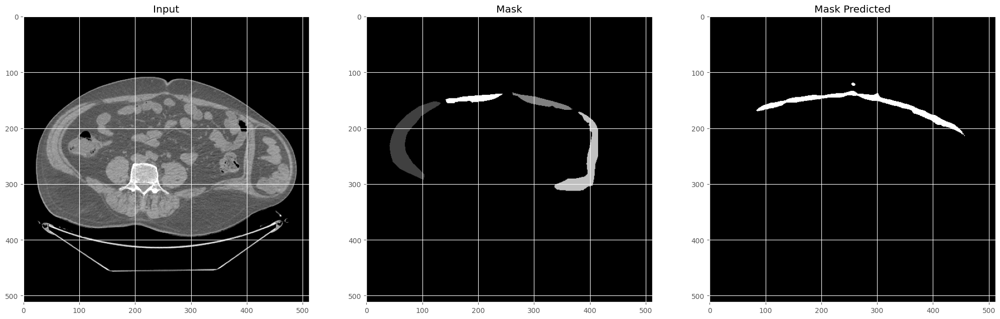

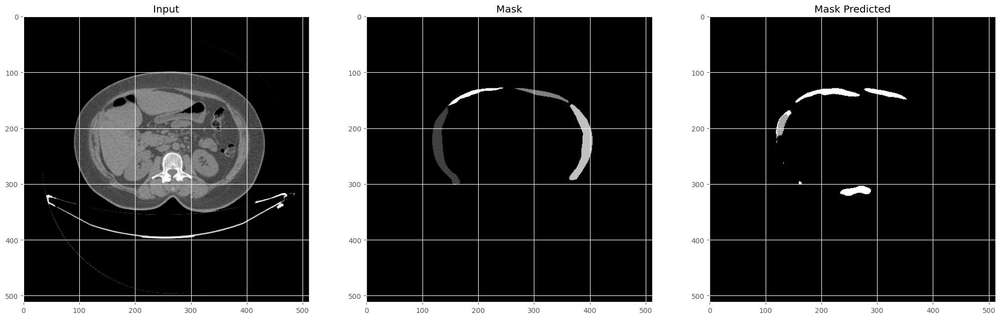

In [41]:
plot_sample(X_test, y_test, pred_test_argmax, test_text)

In [43]:

colab_link = "/content/MultiClass_FocalTverskyLoss.h5"
gdrive_link = "/content/drive/My Drive/MultiClass_UNet/Anvesh/Extension1_Multiclass/WeightFiles"
shutil.copy(colab_link, gdrive_link)

'/content/drive/My Drive/MultiClass_UNet/Anvesh/Extension1_Multiclass/WeightFiles/MultiClass_FocalTverskyLoss.h5'

Need more data for Focal_Tversky

